<a href="https://colab.research.google.com/github/ShuqairABD/Zero-shot-object-detection-GDino/blob/main/ZERO_shot_object_detection_grounding_Dino.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Tue Feb 13 20:51:00 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Install Grounding DINO

In [ ]:
%cd {HOME}

# Клонирование репозитория GroundingDINO из GitHub
!git clone https://github.com/IDEA-Research/GroundingDINO.git

# Смена текущего рабочего каталога на папку GroundingDINO
%cd {HOME}/GroundingDINO

# Установка зависимостей из папки GroundingDINO
!pip install -q -e .

# Установка библиотеки roboflow
!pip install -q roboflow

/content
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 421, done.
remote: Counting objects: 100% (189/189), done.
remote: Compressing objects: 100% (63/63), done.
remote: Total 421 (delta 144), reused 126 (delta 126), pack-reused 232
Receiving objects: 100% (421/421), 12.85 MiB | 21.94 MiB/s, done.
Resolving deltas: 100% (216/216), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 20.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━

In [ ]:
# Импорт модуля os для работы с операционной системой
import os

# Путь к конфигурационному файлу
CONFIG_PATH = os.path.join(HOME, "GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py")

# Вывод пути к файлу и проверка наличия файла
print(CONFIG_PATH, "; exist:", os.path.isfile(CONFIG_PATH))


/content/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py ; exist: True


## Download Grounding DINO Weights


In [ ]:
%cd {HOME}
!mkdir {HOME}/weights
%cd {HOME}/weights

# Загрузка весов модели groundingdino_swint_ogc.pth
!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

/content
/content/weights


In [ ]:
import os

# Имя файла весов
WEIGHTS_NAME = "groundingdino_swint_ogc.pth"

# Путь к файлу весов
WEIGHTS_PATH = os.path.join(HOME, "weights", WEIGHTS_NAME)

# Вывод пути к файлу и проверка наличия файла
print(WEIGHTS_PATH, "; exist:", os.path.isfile(WEIGHTS_PATH))


/content/weights/groundingdino_swint_ogc.pth ; exist: True


## Download Example Data

In [ ]:
%cd {HOME}
!mkdir {HOME}/data
%cd {HOME}/data


/content
/content/data


In [ ]:
# Загрузка файлов 33.jpga и 444.jpg
!wget -q /content/33.jpg
!wget -q /content/444.jpg
!wget -q /content/coffeshop.jpg

## Load Grounding DINO Model

In [ ]:
# Смена текущего рабочего каталога на папку GroundingDINO
%cd {HOME}/GroundingDINO

# Импорт функций для инференса
from groundingdino.util.inference import load_model, load_image, predict, annotate

# Загрузка модели из конфигурационного файла и весов
model = load_model(CONFIG_PATH, WEIGHTS_PATH)


/content/GroundingDINO


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

## Grounding DINO Demo

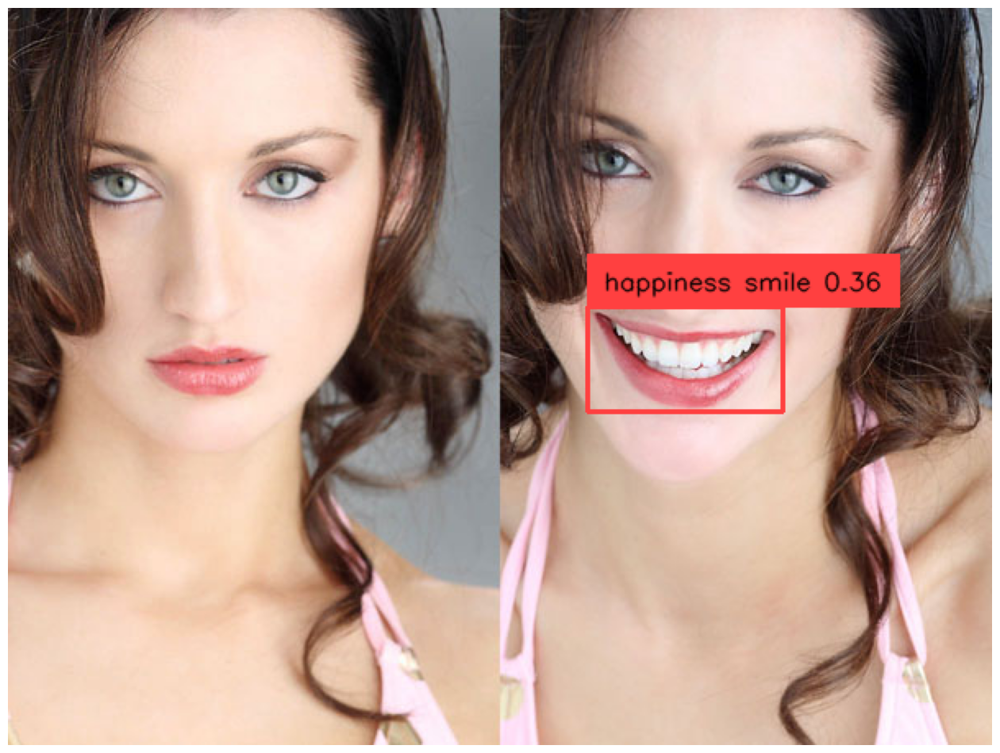

In [ ]:
import os
import supervision as sv

IMAGE_NAME = "duo.jpg"
IMAGE_PATH = os.path.join(HOME, "data", IMAGE_NAME)
#emotion (smile)
TEXT_PROMPT = "emotion (happiness smile)"

# Порог для обнаружения объектов
BOX_TRESHOLD = 0.35

# Порог для текстовых результатов
TEXT_TRESHOLD = 0.25

# Загрузка изображения
image_source, image = load_image(IMAGE_PATH)

# Предсказание объектов на изображении
boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

# Аннотация изображения
annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)


# Отображение аннотированного изображения
%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

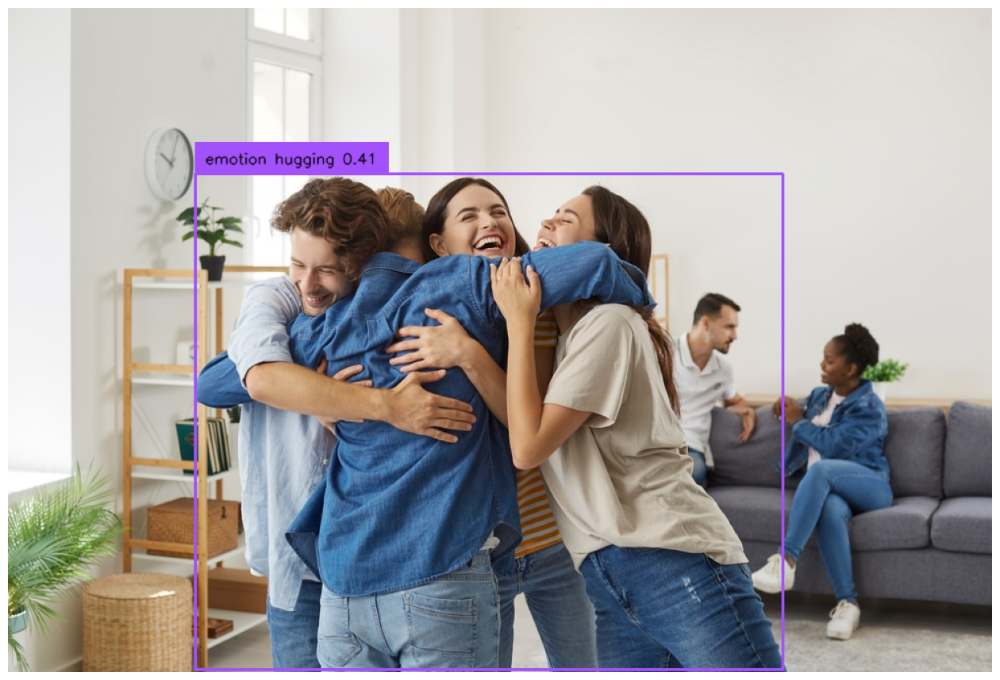

In [ ]:
import os
import supervision as sv

IMAGE_NAME = "bee_clutter_free_blogpost_main-1.jpg"
IMAGE_PATH = os.path.join(HOME, "data", IMAGE_NAME)

TEXT_PROMPT = "emotion hugging"
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

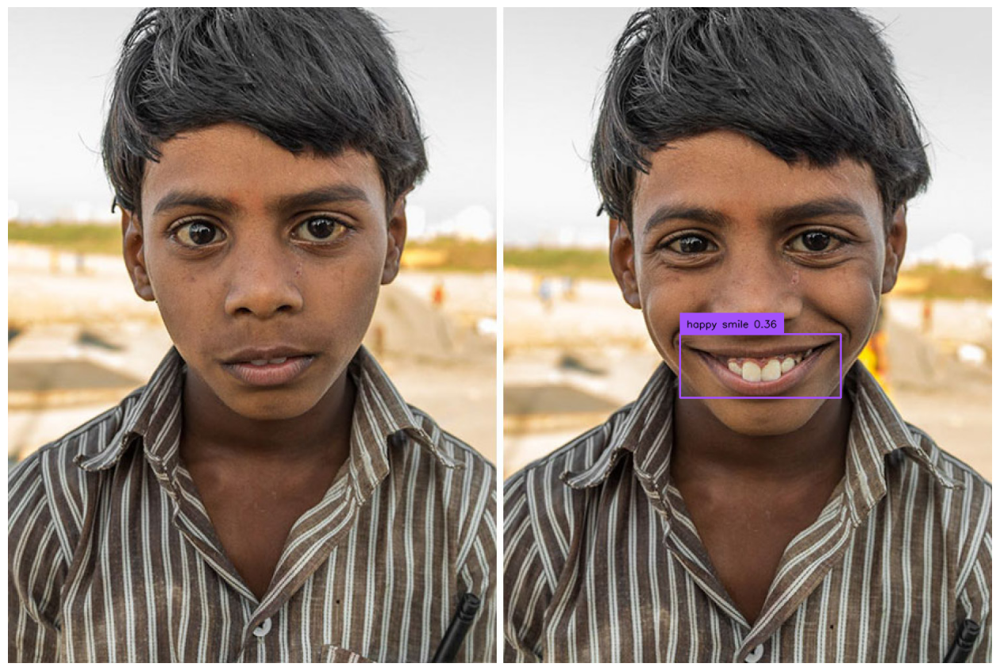

In [ ]:
import os
import supervision as sv

IMAGE_NAME = "dia-mundial-de-la-sonrisa-foto-jay-weinstein.jpg"
IMAGE_PATH = os.path.join(HOME, "data", IMAGE_NAME)

# "coffe cup most to the right", "mens shadow"
TEXT_PROMPT = "emotion (happy smile) "
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

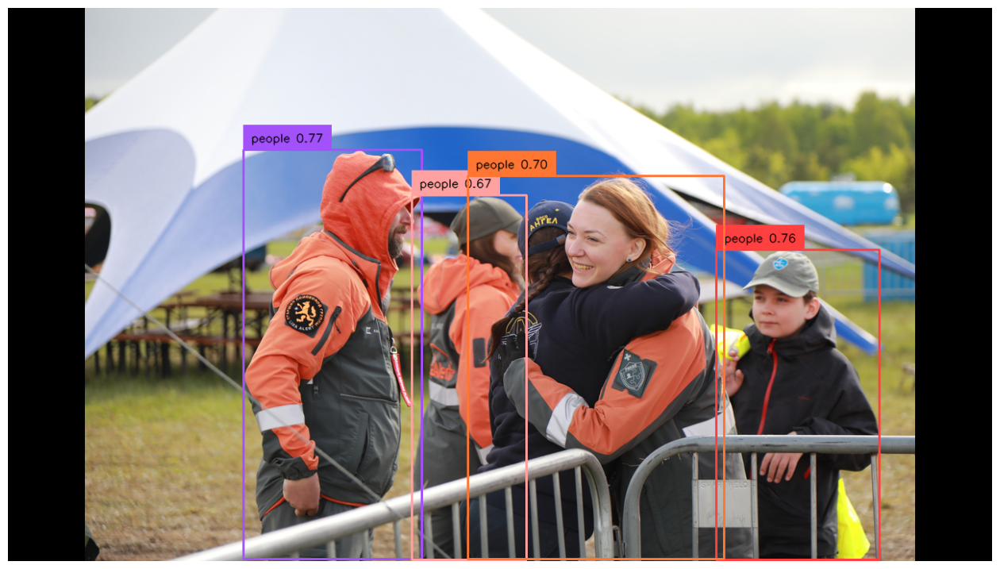

In [ ]:
import os
import supervision as sv

IMAGE_NAME = "/content/data/IMG_0072_result.png"
IMAGE_PATH = os.path.join(HOME, "data", IMAGE_NAME)

# "coffe cup most to the right", "mens shadow"
TEXT_PROMPT = "people"
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

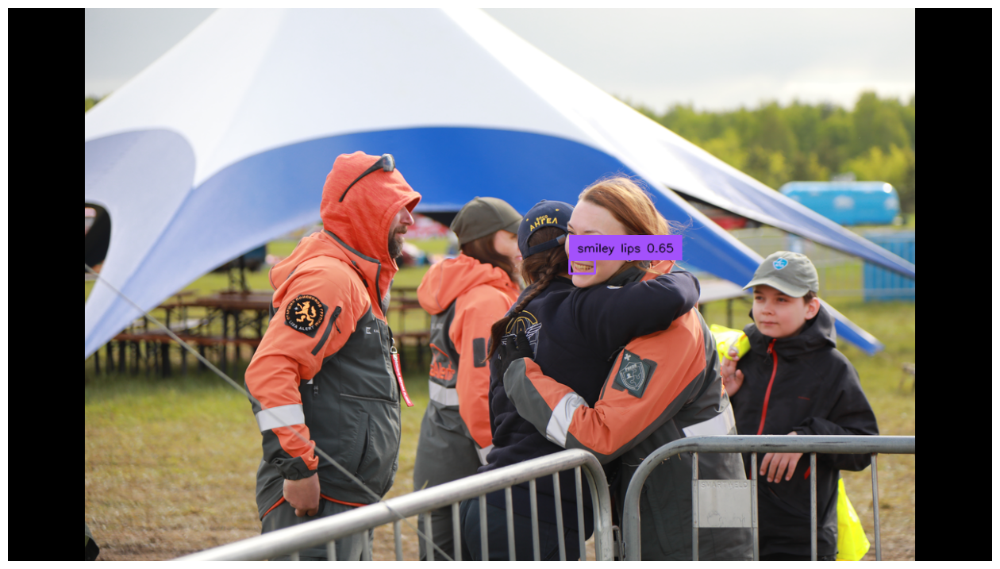

In [ ]:
import os
import supervision as sv

IMAGE_NAME = "/content/data/IMG_0072_result.png"
IMAGE_PATH = os.path.join(HOME, "data", IMAGE_NAME)

# "coffe cup most to the right", "mens shadow"
TEXT_PROMPT = "smiley lips"
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

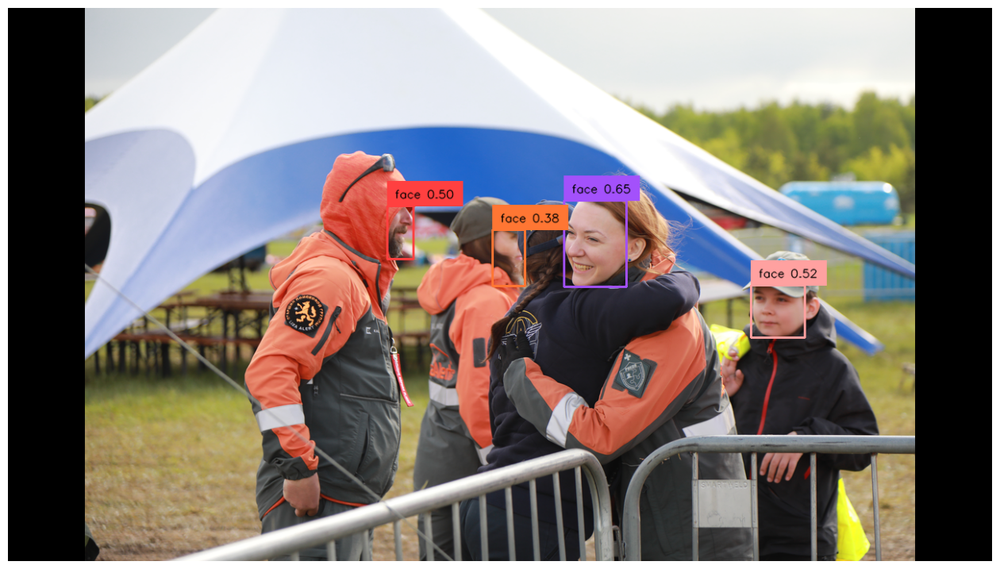

In [ ]:
import os
import supervision as sv

IMAGE_NAME = "IMG_0072_result.png"
IMAGE_PATH = os.path.join(HOME, "data", IMAGE_NAME)

# "coffe cup most to the right", "mens shadow"
TEXT_PROMPT = " face "
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

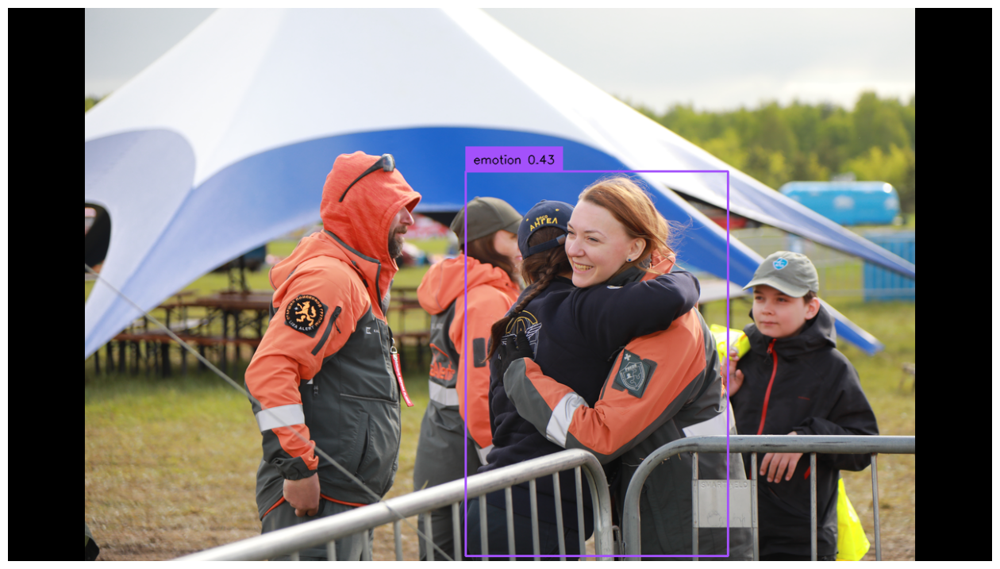

In [ ]:
import os
import supervision as sv

IMAGE_NAME = "IMG_0072_result.png"
IMAGE_PATH = os.path.join(HOME, "data", IMAGE_NAME)

# "coffe cup most to the right", "mens shadow"
TEXT_PROMPT = " emotion(hugging and happiness) "
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

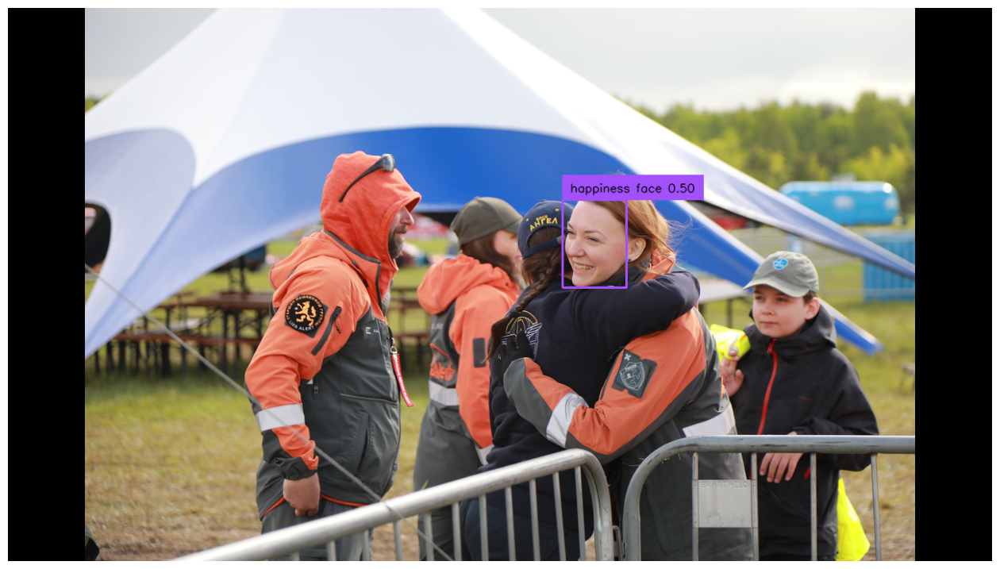

In [ ]:
import os
import supervision as sv

IMAGE_NAME = "/content/data/IMG_0072_result.png"
IMAGE_PATH = os.path.join(HOME, "data", IMAGE_NAME)

# "coffe cup most to the right", "mens shadow"
TEXT_PROMPT = "happiness face"
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

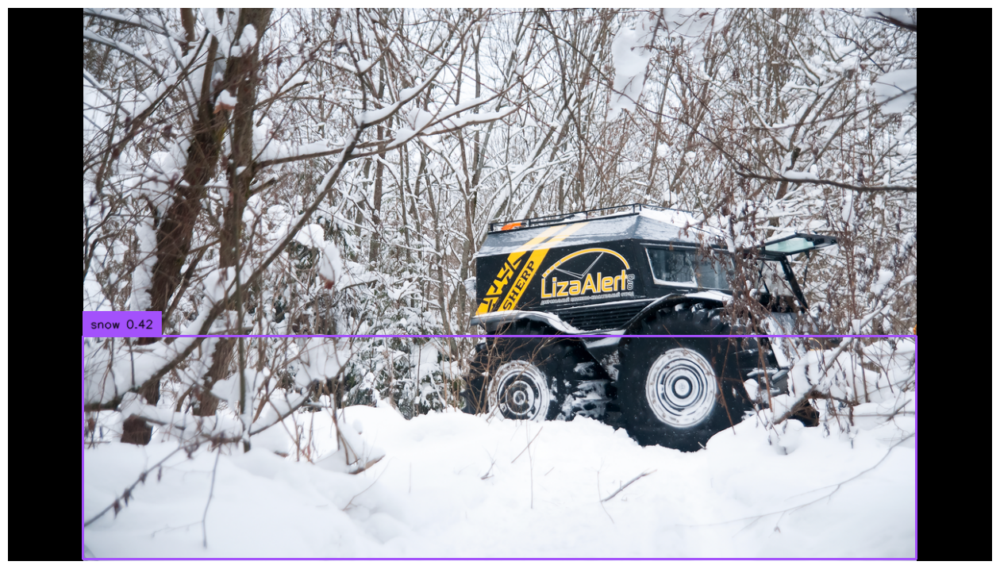

In [ ]:
import os
import supervision as sv

IMAGE_NAME = "3_result.png"
IMAGE_PATH = os.path.join(HOME, "data", IMAGE_NAME)

# "coffe cup most to the right", "mens shadow"
TEXT_PROMPT = "snow,grass"
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

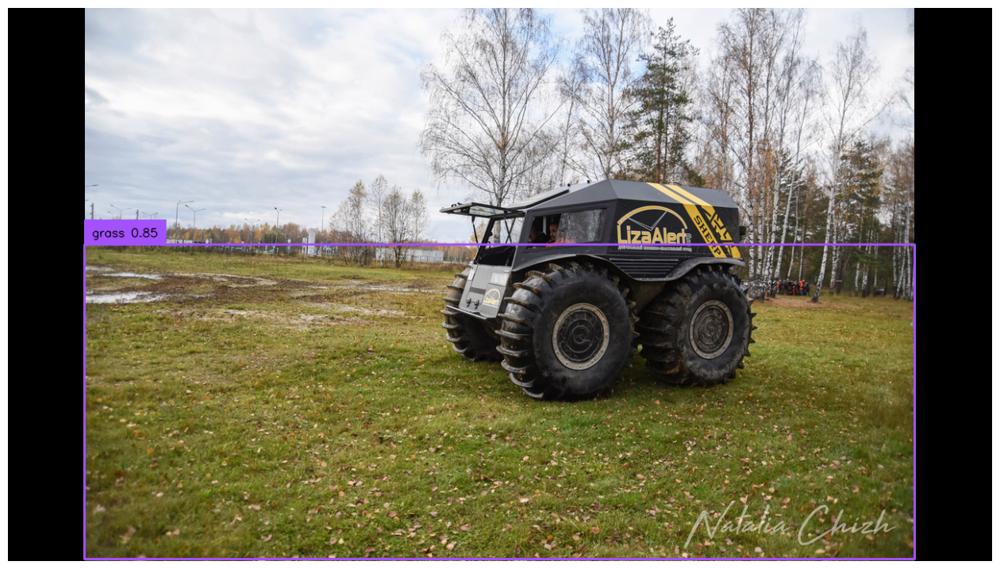

In [ ]:
import os
import supervision as sv

IMAGE_NAME = "5_result.png"
IMAGE_PATH = os.path.join(HOME, "data", IMAGE_NAME)

# "coffe cup most to the right", "mens shadow"
TEXT_PROMPT = "grass,snow"
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))